<a href="https://colab.research.google.com/github/Wahib-eng/AdditionofTowArraysandAverage/blob/master/bocekTespiti_pynb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!nvidia-smi

Fri May 24 20:54:13 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   33C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
!pip install ultralytics

In [ ]:
from ultralytics import YOLO
import os
HOME = os.getcwd()
print(HOME)

/content


In [ ]:
from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()



Ultralytics YOLOv8.2.21 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 30.3/78.2 GB disk)


In [ ]:
from ultralytics import YOLO
from IPython.display import display, Image

In [ ]:
!yolo task=detect mode=predict model=yolov8l.pt conf=0.50 source= "/content/drive/MyDrive/TTanalysis/test/images/ITTHungary_R32_220714_LIANG-Jingkun-3-Alexis-LEBRUN-1-_5_jpg.rf.6e4232c9335b14190fdd44252f23fcbb.jpg"

Ultralytics YOLOv8.2.21 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8l summary (fused): 268 layers, 43668288 parameters, 0 gradients, 165.2 GFLOPs

image 1/1 /content/drive/MyDrive/TTanalysis/test/images/ITTHungary_R32_220714_LIANG-Jingkun-3-Alexis-LEBRUN-1-_5_jpg.rf.6e4232c9335b14190fdd44252f23fcbb.jpg: 640x640 2 persons, 1 tennis racket, 63.2ms
Speed: 3.2ms preprocess, 63.2ms inference, 1988.4ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict3
💡 Learn more at https://docs.ultralytics.com/modes/predict


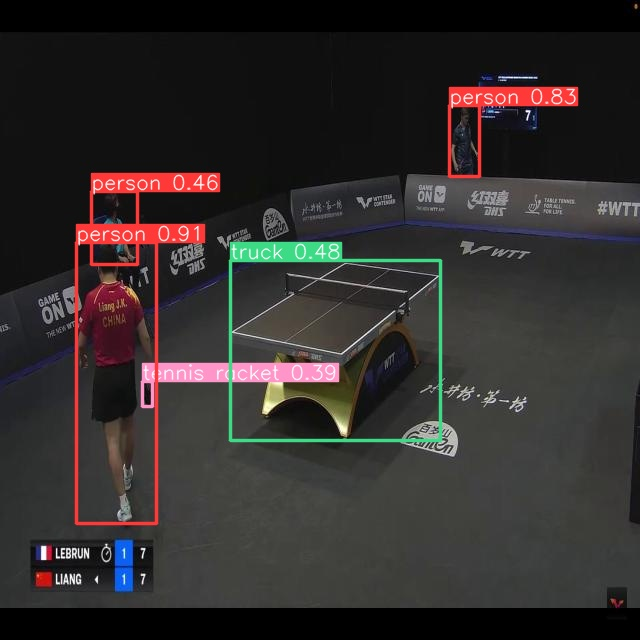

In [ ]:
Image(filename="/content/runs/detect/predict4/ITTHungary_R32_220714_LIANG-Jingkun-3-Alexis-LEBRUN-1-_5_jpg.rf.6e4232c9335b14190fdd44252f23fcbb.jpg",height=500)

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="ImxMauUX41hTySVncMrO")
project = rf.workspace("pest-tespiti").project("tarimtek")
version = project.version(7)
dataset = version.download("yolov8")


loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.2.21, to fix: `pip install ultralytics==8.0.196`


In [ ]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets


/content/datasets


In [ ]:
%cd {HOME}

!yolo task=detect mode=train model=yolov8m.pt data={dataset.location}/data.yaml epochs=25 imgsz=800 plots=True

/content
Ultralytics YOLOv8.2.21 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/TarimTek-7/data.yaml, epochs=25, time=None, patience=100, batch=16, imgsz=800, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf

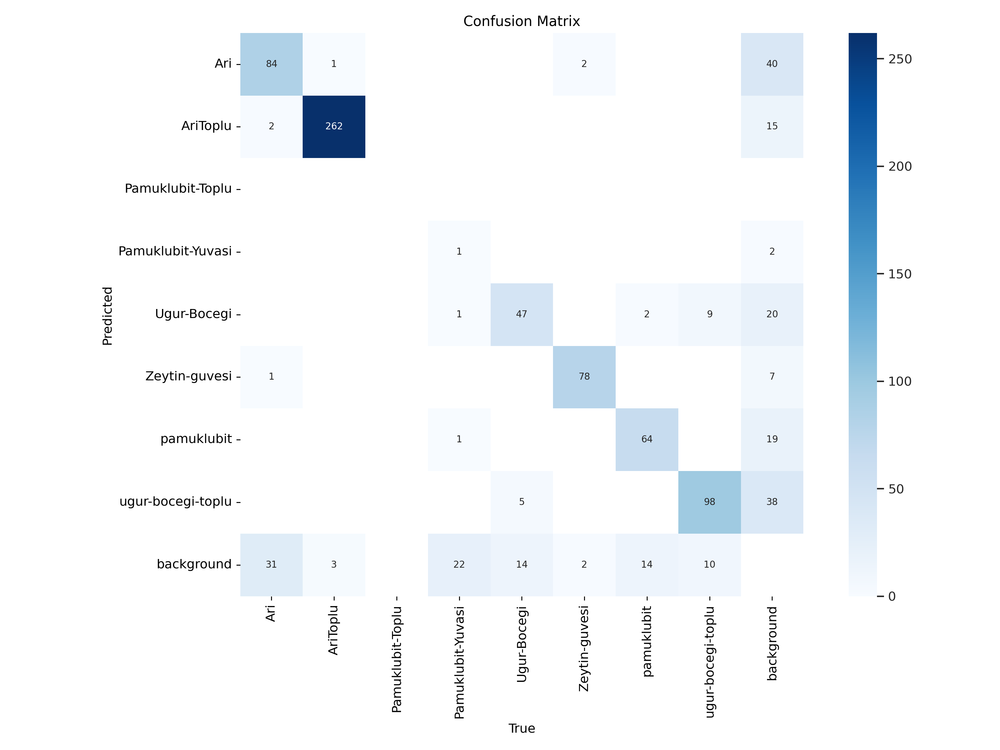

In [ ]:
Image(filename=f'/content/runs/detect/train/confusion_matrix.png', width=600)

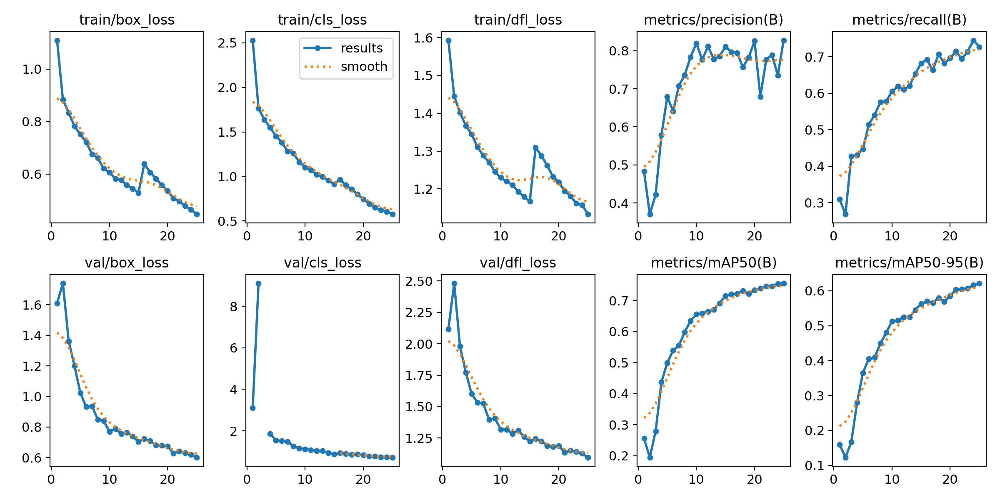

In [ ]:
Image(filename=f'/content/runs/detect/train/results.png', width=600)


In [ ]:
!yolo task=detect mode=val model= /content/runs/detect/train//weights/best.pt data={dataset.location}/data.yaml

Ultralytics YOLOv8.2.21 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25844392 parameters, 0 gradients, 78.7 GFLOPs
val: Scanning /content/TarimTek-7/valid/labels.cache... 298 images, 9 backgrounds, 0 corrupt: 100% 298/298 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 19/19 [00:17<00:00,  1.11it/s]
                   all        298        754      0.828      0.726      0.755      0.621
                   Ari        298        118      0.701      0.653      0.698      0.375
              AriToplu        298        266      0.959      0.985      0.989      0.917
     Pamuklubit-Yuvasi        298         25          1      0.074      0.173     0.0881
           Ugur-Bocegi        298         66      0.688      0.788      0.726      0.527
         Zeytin-guvesi        298         82      0.913      0.951      0.972      0.909
            pamuklubit        298         80    

In [ ]:
!yolo task=detect mode=predict model=/content/runs/detect/train/weights/best.pt conf=0.50 source={dataset.location}/test/images save=True

Ultralytics YOLOv8.2.21 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25844392 parameters, 0 gradients, 78.7 GFLOPs

image 1/143 /content/TarimTek-7/test/images/000051_jpg.rf.7ec187b458238d2fba4ffc6553f4759e.jpg: 800x800 1 Zeytin-guvesi, 57.0ms
image 2/143 /content/TarimTek-7/test/images/000051_jpg.rf.bfecc03dab0c1b5c5d37e3a1d982fe1e.jpg: 800x800 1 Zeytin-guvesi, 57.0ms
image 3/143 /content/TarimTek-7/test/images/000053_jpg.rf.8b40ffbb4bd62e5a4add9974760d489b.jpg: 800x800 1 Zeytin-guvesi, 57.0ms
image 4/143 /content/TarimTek-7/test/images/000053_jpg.rf.d690f9e096c449e2f28062e01c488ffb.jpg: 800x800 1 Zeytin-guvesi, 57.0ms
image 5/143 /content/TarimTek-7/test/images/000056_jpg.rf.89f663fb062b466c709aca4e0fd1c1b3.jpg: 800x800 1 Zeytin-guvesi, 37.4ms
image 6/143 /content/TarimTek-7/test/images/000056_jpg.rf.9834b0535fd724f4dc894ebe646b8f94.jpg: 800x800 1 Zeytin-guvesi, 35.4ms
image 7/143 /content/TarimTek-7/test/images/000058_jpg.rf.996a8

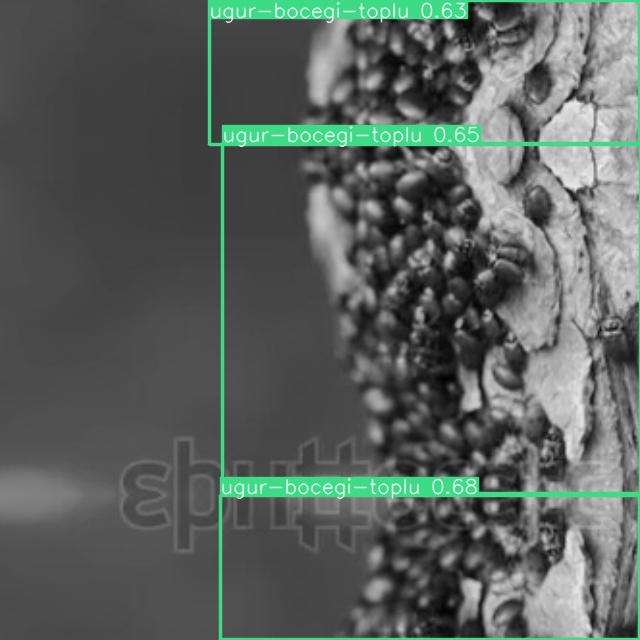

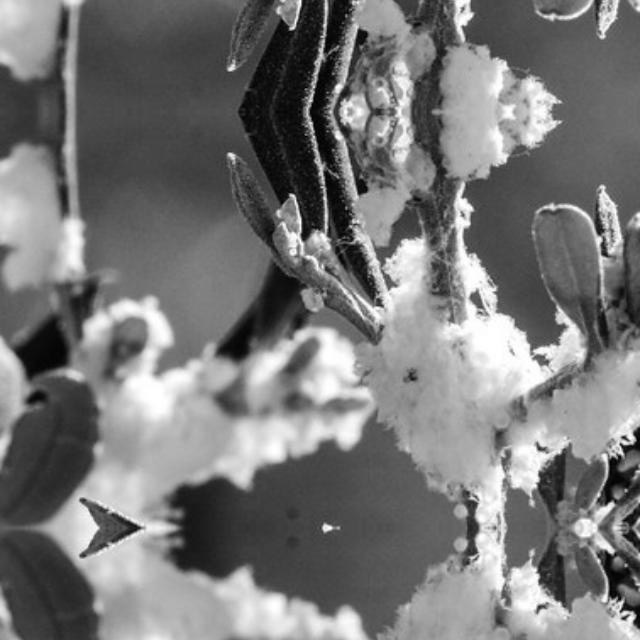

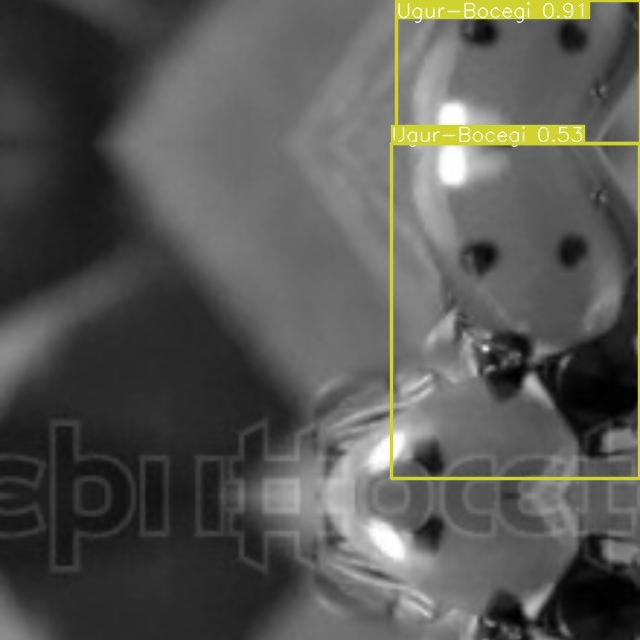

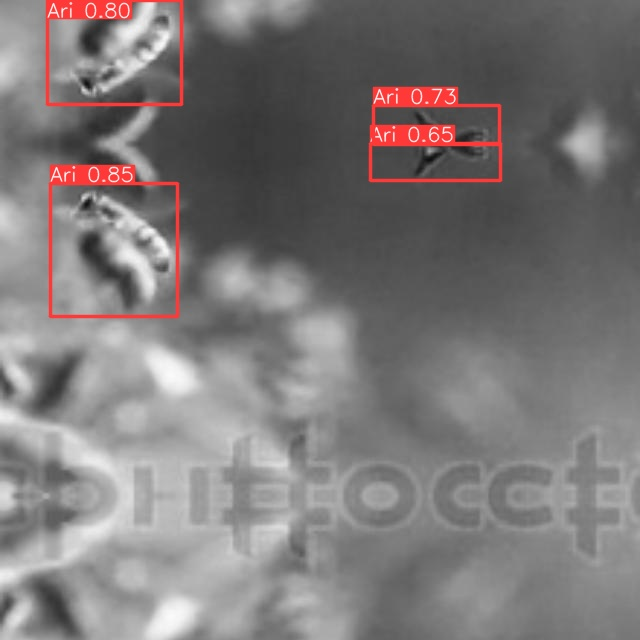

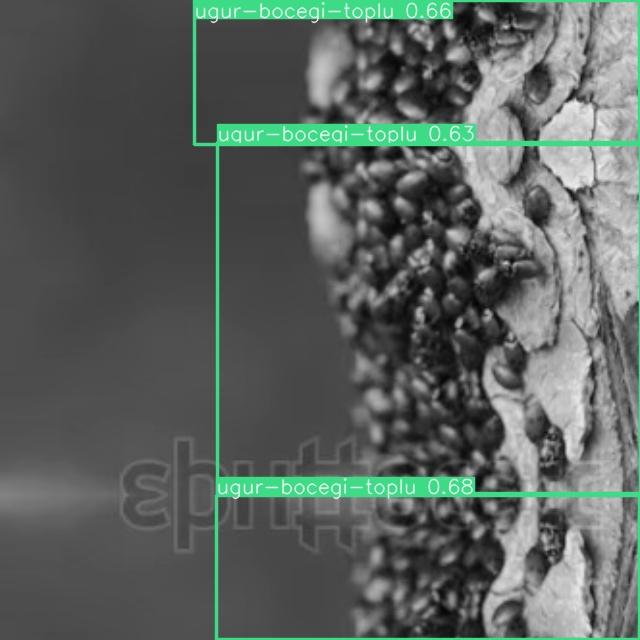

...

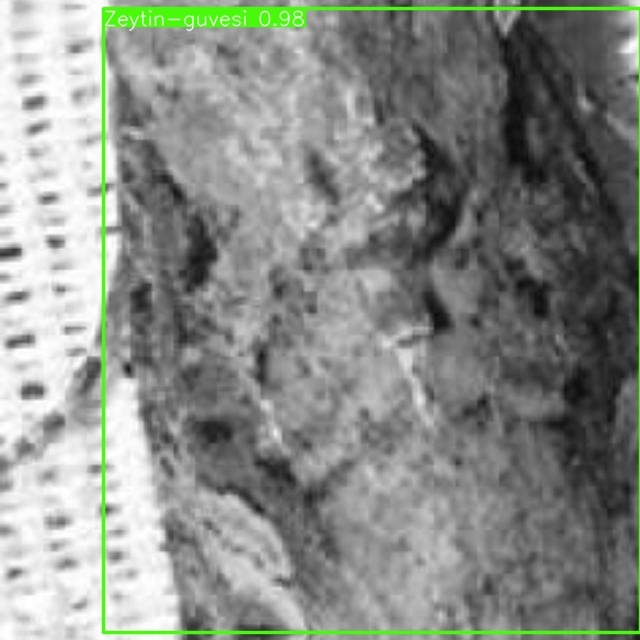

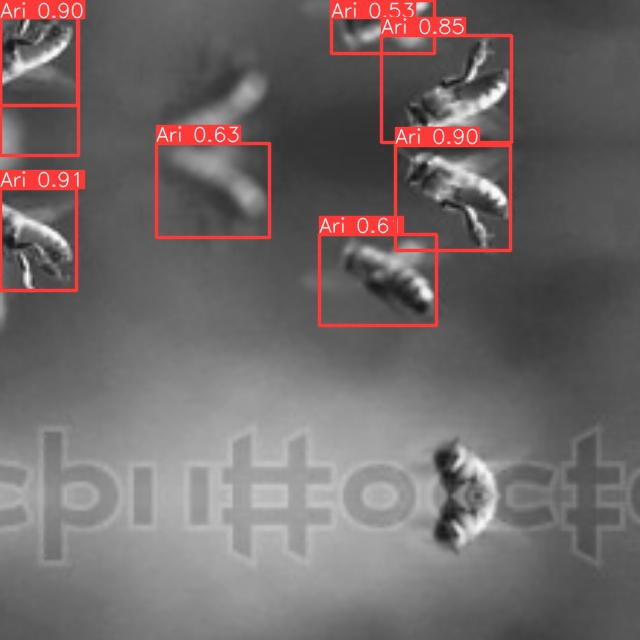

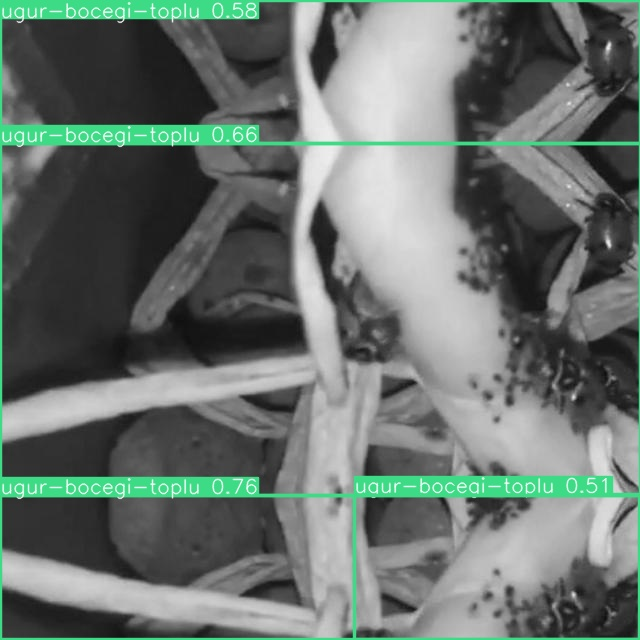

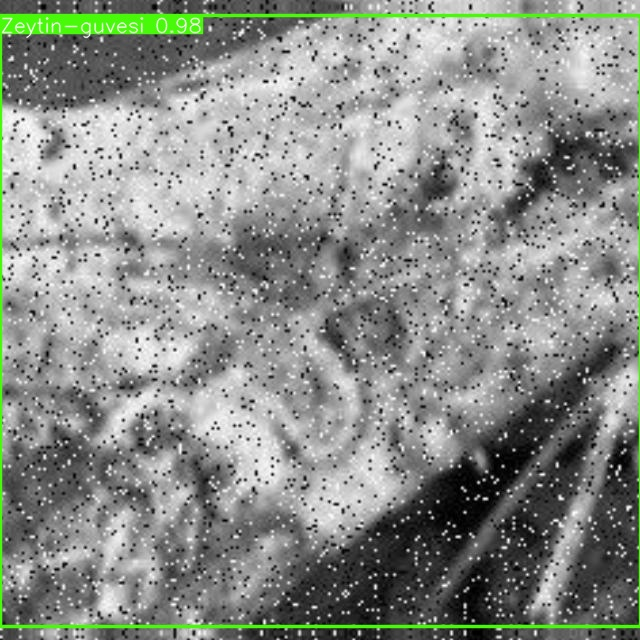

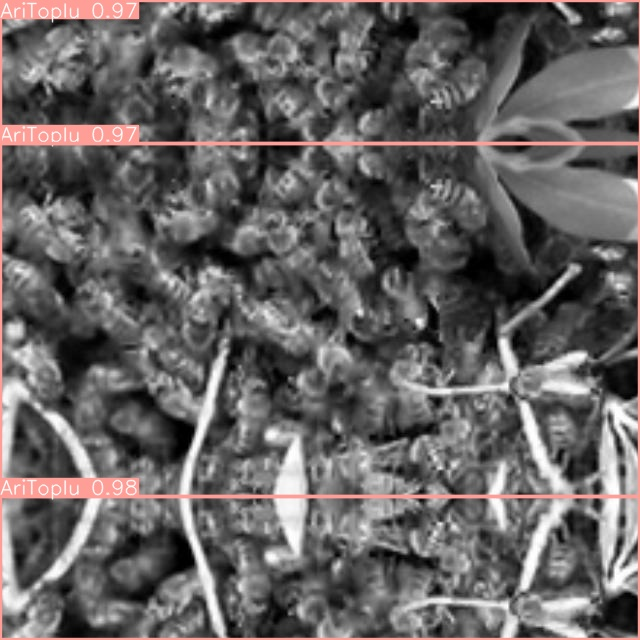

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'/content/runs/detect/predict5/*.jpg'):
      display(Image(filename=image_path, width=500))
      print("\n")